## Código para cargar las imágenes
### Necesario en caso de error en la subida manual de Google Collab u otros problemas

In [23]:
from google.colab import files
import cv2
import matplotlib.pyplot as plt

# Función para subir archivos
uploaded = files.upload()

# Verifica si las imágenes se han cargado
for filename in uploaded.keys():
    print(f'Archivo cargado: {filename}')

# Función para verificar y cargar las imágenes
def load_images(uploaded_files):
    images = {}
    for filename in uploaded_files.keys():
        img = cv2.imdecode(np.frombuffer(uploaded_files[filename], np.uint8), cv2.IMREAD_COLOR)
        if img is None:
            print(f"Error al cargar la imagen: {filename}")
        else:
            images[filename] = img
    return images

# Carga de imágenes
images = load_images(uploaded)

# Verificación de las imágenes cargadas
print(f"Imágenes cargadas: {list(images.keys())}")

Saving prueba_1.jpg to prueba_1.jpg
Archivo cargado: prueba_1.jpg
Imágenes cargadas: ['prueba_1.jpg']


## Librerías

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors
import math
import matplotlib.lines as mlines

## Importación de imágenes y conversión a escala de grises

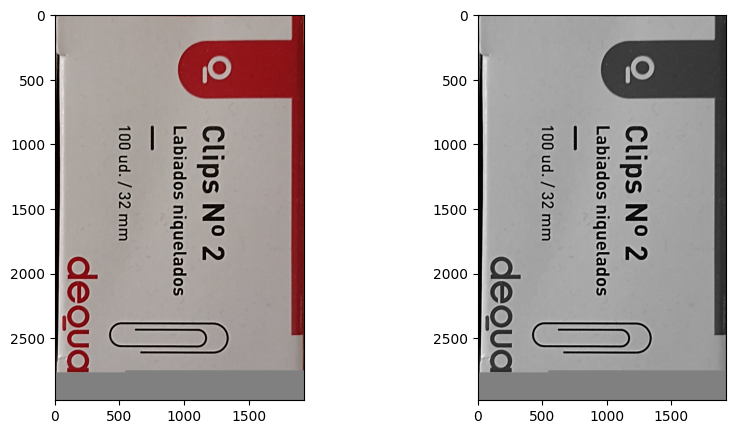

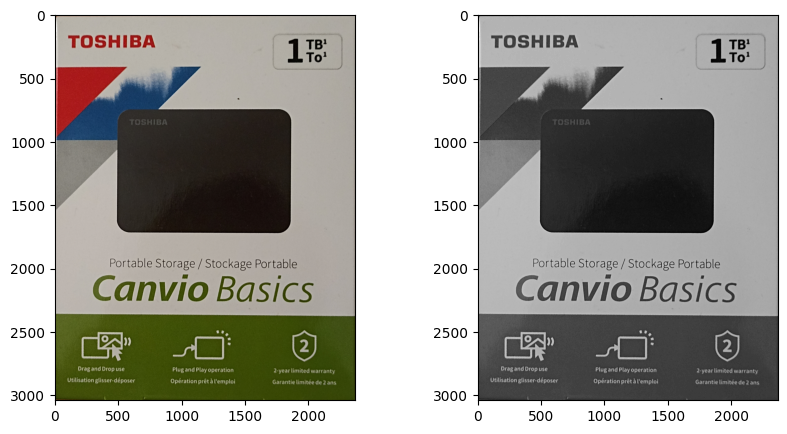

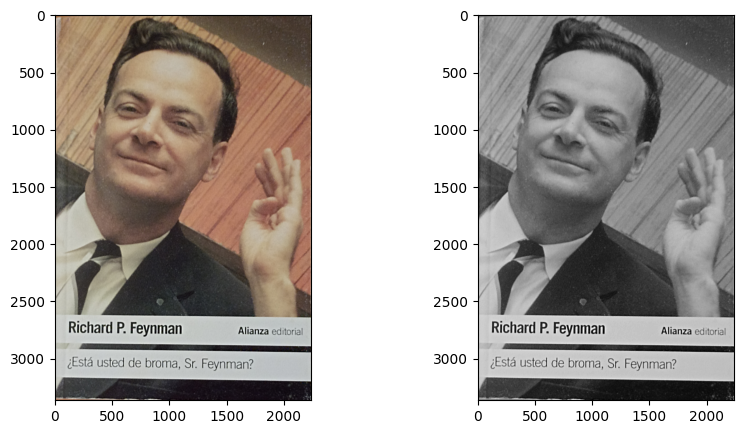

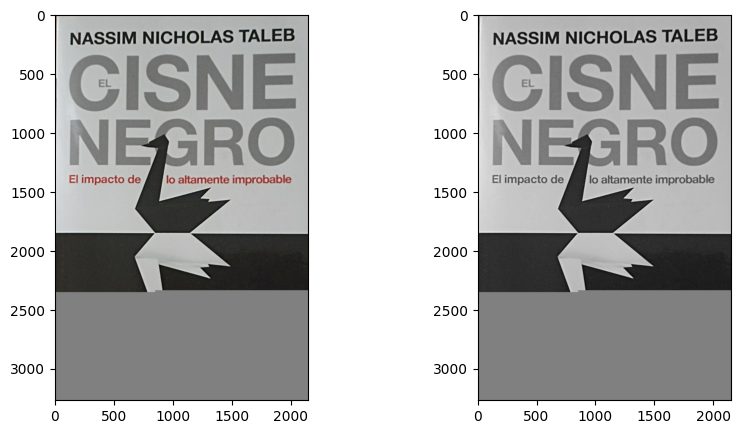

In [4]:
modelos = ["clips.jpg", "hdd.jpg", "feynman.jpg", "cisne.jpg"]
modelos_gris = []
for i, label in enumerate(modelos):
  img = cv2.imread(label)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  modelos_gris.append(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY))
  fig, axs = plt.subplots(1, 2, figsize=(10,5))
  axs[0].imshow(img)
  axs[1].imshow(modelos_gris[i], cmap='gray')


## Extracción de características SIFT

---



In [16]:
# Función que extrae las características SIFT de una lista de imágenes
# Recibe como entrada una lista con los nombres de las imagenes que debe importar
# Devuelve tres listas:
#   - Imágenes en escala de grises
#   - Posiciones de los features
#   - Descriptores asociados

def SIFTextractor(modelos):
  sift = cv2.xfeatures2d.SIFT_create() #Creación del detector

  # Inicializaciones
  modelos_gris = []
  kps_list = []
  descrs_list = []
  features = {}

  # Conversión de las imagenes a escala de grises y extración de features
  # Las features se almacenan en listas, de manera que el primer elemento de
  # cada lista corresponde a la primera imagen, y así sucesivamente
  for i, label in enumerate(modelos):
    img = cv2.imread(label)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    modelos_gris.append(cv2.cvtColor(img.copy(), cv2.COLOR_RGB2GRAY))
    kps, descrs = sift.detectAndCompute(modelos_gris[i], None)
    kps_list.append(kps)
    descrs_list.append(descrs)

    # Agregar elementos al diccionario
    nombre_img = label.split(".")[0] # Obtener el nombre del archivo sin la extensión
    features[nombre_img] = {
        "label": nombre_img, # nombre de la imagen
        "modelo": img, #imagen a color
        "modelo_gris": modelos_gris[i], #imagen en escala de grises
        "kps": kps_list[i], # keypoints
        "descrs": descrs_list[i] # descriptors
    }

  return features

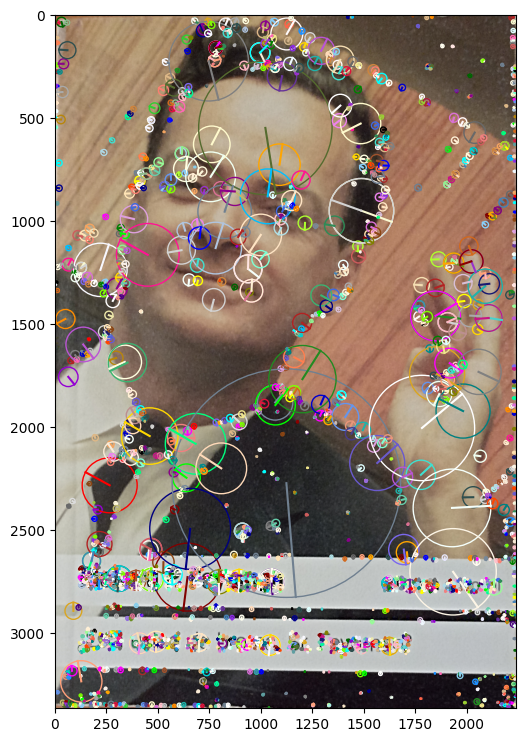

In [7]:
modelos = ["clips.jpg", "hdd.jpg", "feynman.jpg", "cisne.jpg"]
features_modelos = SIFTextractor(modelos)

# Visualización de ejemplo de las características extraídas
imgin = features_modelos["feynman"]["modelo"]
kps = features_modelos["feynman"]["kps"]
imgout = cv2.drawKeypoints(imgin, kps, cv2.DrawMatchesFlags_DEFAULT)

fig, ax = plt.subplots(1,1,figsize=(9,9))
ax.imshow(imgin, cmap='gray');
colors = list(mcolors.CSS4_COLORS.keys()) # Lista de colores diferentes.
for i, kp in enumerate(kps):
  circle = plt.Circle(kp.pt, kp.size, fill=False, color=colors[i%len(colors)])
  ax.add_patch(circle)
  l = mlines.Line2D([kp.pt[0],kp.pt[0]+math.cos(math.radians(kp.angle))*kp.size],
                    [kp.pt[1],kp.pt[1]+math.sin(math.radians(kp.angle))*kp.size], color=colors[i%len(colors)])
  ax.add_line(l)

### Emparejamiento de puntos

In [26]:
modelos = ["clips.jpg", "hdd.jpg", "feynman.jpg", "cisne.jpg"]
features_modelos = SIFTextractor(modelos)
pruebas = ["prueba_1.jpg", "prueba_2.jpg", "prueba_3.jpg", "prueba_4.jpg"]
features_pruebas = SIFTextractor(pruebas)

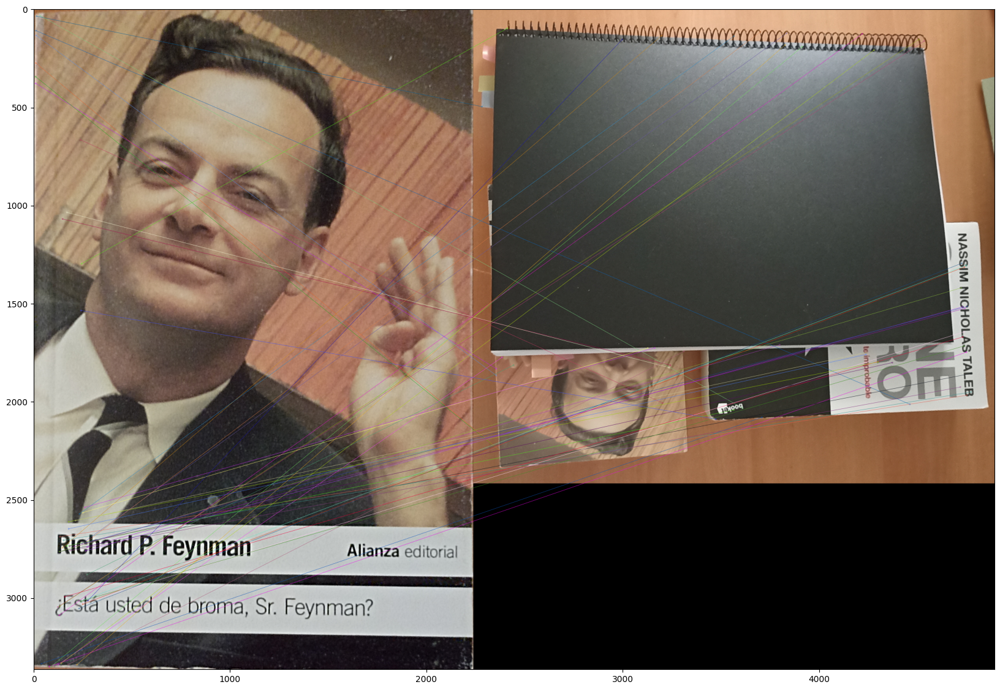

In [28]:
# Creamos un matcher para hacer la comparación
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

# Cálculo de matches y ordenación según distancia
matches = bf.match(features_modelos["feynman"]["descrs"],features_pruebas["prueba_1"]["descrs"])

# Dibujamos los matches (matches[:x] para limitar el número de dibujos)
img1 = features_modelos["feynman"]["modelo"]
kp1 = features_modelos["feynman"]["kps"]
img2 = features_pruebas["prueba_1"]["modelo"]
kp2 = features_pruebas["prueba_1"]["kps"]

img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:50], img2, flags=2)
fig, ax = plt.subplots(1,1,figsize=(25,14))
ax.imshow(img_matches)


## Reconocimiento de objetos

In [29]:
# Función encargada de dibujar un rectángulo alrededor de un objeto detectado a
# través de los matches. También escribe el nombre del objeto dentro del rectángulo

def ObjectDetector(matches, MIN_MATCH_COUNT, nom, img1, img2, kp1, kp2):
  if len(matches)>MIN_MATCH_COUNT:
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)

    # Obtención de matriz de homografía
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
    matchesMask = mask.ravel().tolist()
    h, w, c = img1.shape
    # Reorganización de los datos
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    # Transformación usando la matriz de homografía
    dst = cv2.perspectiveTransform(pts,M)
    # Dibujo del rectángulo en torno al objeto
    img2 = cv2.polylines(img2,[np.int32(dst)],True,255,3, cv2.LINE_AA)


    # Dibujo del texto con el nombre del objeto
    x, y, w, h = cv2.boundingRect(dst)
    x_center = x + w // 2
    y_center = y + h // 2
    cv2.putText(img2, #destino
              features_modelos[nom]["label"], #texto
              (x_center, y_center), #posicion
              cv2.FONT_HERSHEY_SIMPLEX, #fuente
              4, #escala
              (255,255,0), #color
              3) #grosor


    # Parámetros de dibujo necesarios para cv2.drawMatches
    draw_params = dict(matchColor = (0,255,0), # draw matches in green color
      singlePointColor = None,
      matchesMask = matchesMask, # draw only inliers
      flags = 2)

    # Dibujo de los macthes
    img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches,None,**draw_params)
    fig, ax = plt.subplots(1,1,figsize=(25,14))
    ax.imshow(img3)

  else:
    print( "Not enough matches are found - {}/{}".format(len(matches), MIN_MATCH_COUNT) )
    matchesMask = None

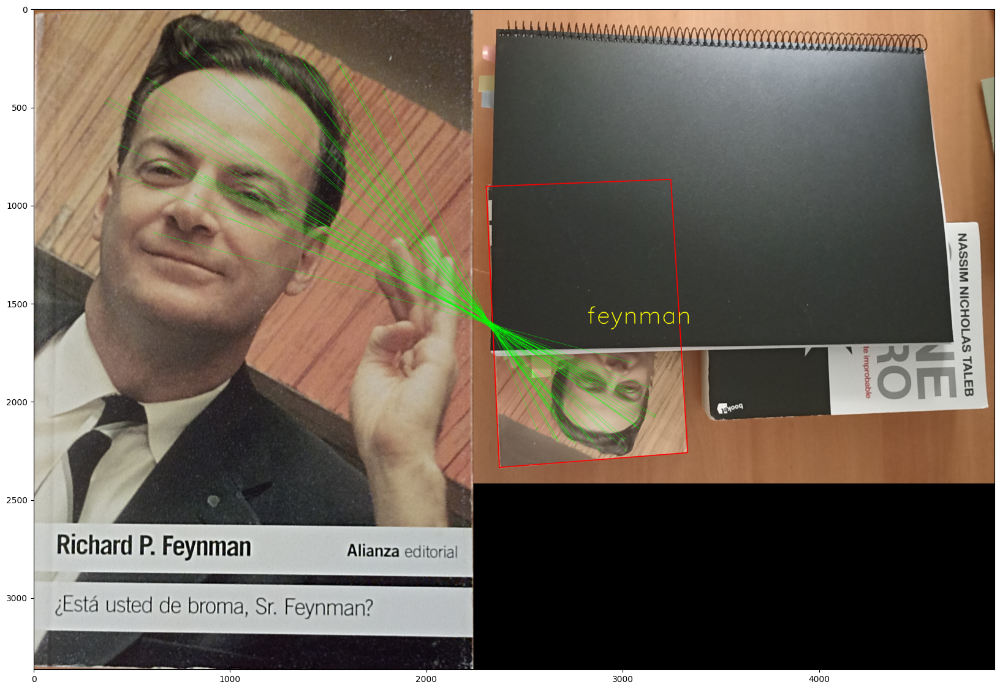

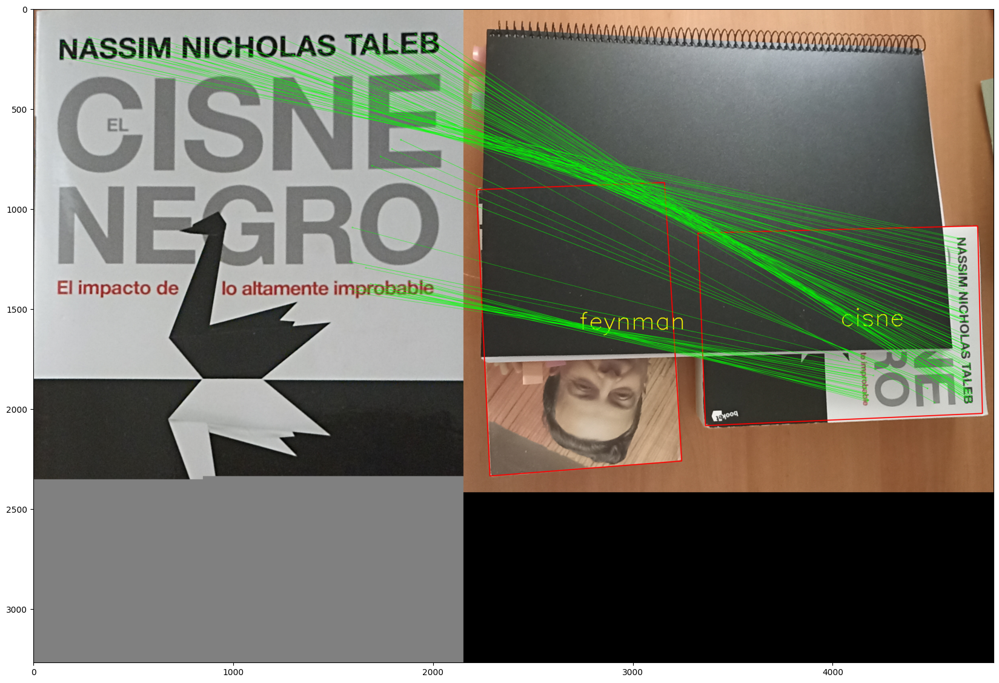

In [31]:
# Lista de objetos que queremos que detecte
nombres = ["feynman", "cisne"]

bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
MIN_MATCH_COUNT = 10

# Ejecución del algoritmo para cada objeto (se muestran en imágenes separadas)
for i, nom in enumerate(nombres):
  matches = bf.match(features_modelos[nom]["descrs"],features_pruebas["prueba_1"]["descrs"])

  img1 = features_modelos[nom]["modelo"]
  kp1 = features_modelos[nom]["kps"]
  img2 = features_pruebas["prueba_1"]["modelo"]
  kp2 = features_pruebas["prueba_1"]["kps"]

  ObjectDetector(matches, MIN_MATCH_COUNT, nom, img1, img2, kp1, kp2)